
![](https://img.shields.io/badge/Python-3776AB.svg?style=for-the-badge&logo=Python&logoColor=white) [![Streamlit App](https://static.streamlit.io/badges/streamlit_badge_black_white.svg)]()
<p style="padding: 10px; background-color: #0f4c5c; margin: 0; color: white; 
font-family: 'New Times Roman', serif; font-size: 150%; text-align: center; 
font-weight: 500;">
Resume Analysis
</p>

In [13]:
#from IPython.display import Image
#Image(".jpg")


- This project aims to develop a tool that helps job seekers in South Africa optimize their resumes for better visibility and compatibility with ATS software.
- This tool could analyze resumes for keywords, formatting, and structure, providing actionable feedback on how to improve their chances of passing initial ATS screening
- This can also help applicant know which skills they might be lacking for the category they're applying for

<p style="padding: 10px; background-color: #0f4c5c; margin: 0; color: white; 
font-family: 'New Times Roman', serif; font-size: 150%; text-align: center; 
font-weight: 500;">
Installing Packages
</p>

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import re
import nltk
import pickle

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from wordcloud import WordCloud

# We can download NLTK directly, i.e.
nltk.download(['punkt','stopwords'])
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, TreebankWordTokenizer
from nltk.stem import WordNetLemmatizer
import string
from IPython.display import Image


[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<p style="padding: 10px; background-color: #0f4c5c; margin: 0; color: white; 
font-family: 'New Times Roman', serif; font-size: 150%; text-align: center; 
font-weight: 500;">
Dataset
</p>

- The Resume dataset can be found on Kaggle [here](https://www.kaggle.com/datasets/gauravduttakiit/resume-dataset/data)

In [15]:
data = pd.read_csv('/kaggle/input/resume-dataset/UpdatedResumeDataSet.csv')

<p style="padding: 10px; background-color: #0f4c5c; margin: 0; color: white; 
font-family: 'New Times Roman', serif; font-size: 150%; text-align: center; 
font-weight: 500;">
Exploratory Data Analysis 
</p>

In [16]:
data.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [17]:
data.shape


(962, 2)

In [18]:
data['Category'].value_counts()

Category
Java Developer               84
Testing                      70
DevOps Engineer              55
Python Developer             48
Web Designing                45
HR                           44
Hadoop                       42
Blockchain                   40
ETL Developer                40
Operations Manager           40
Data Science                 40
Sales                        40
Mechanical Engineer          40
Arts                         36
Database                     33
Electrical Engineering       30
Health and fitness           30
PMO                          30
Business Analyst             28
DotNet Developer             28
Automation Testing           26
Network Security Engineer    25
SAP Developer                24
Civil Engineer               24
Advocate                     20
Name: count, dtype: int64

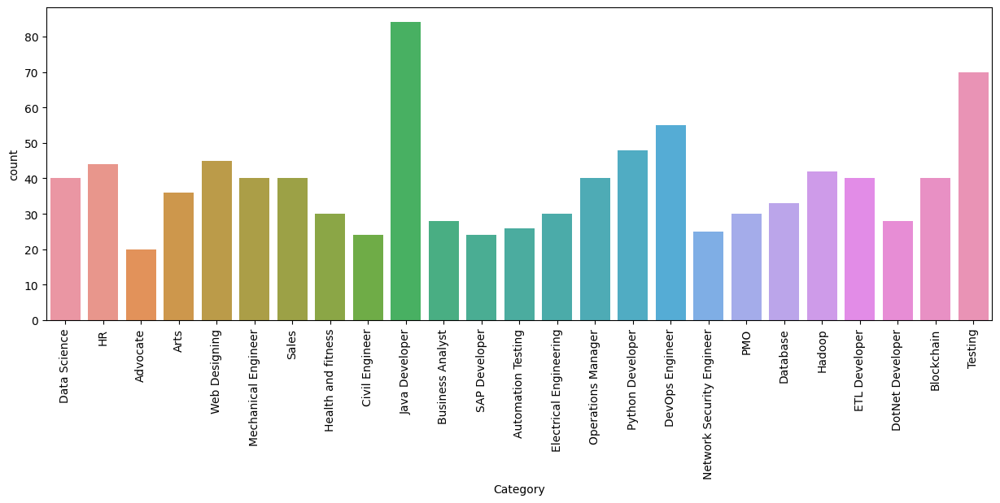

In [19]:
plt.figure(figsize=(15,5))
sns.countplot(x='Category', data=data)
plt.xticks(rotation=90)
plt.show()

In [20]:
data.describe()

,Category,Resume
count,962,962
unique,25,166
top,Java Developer,"Technical Skills Web Technologies: Angular JS,..."
freq,84,18


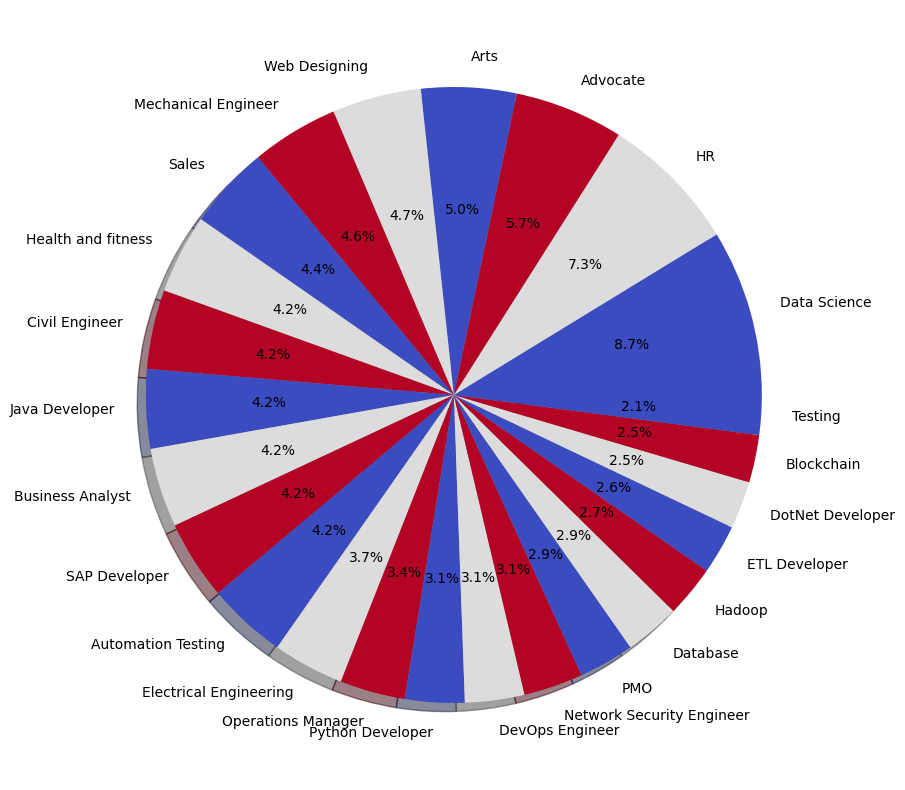

In [21]:
counts = data['Category'].value_counts()
labels = data['Category'].unique()
plt.figure(figsize=(15,10))

plt.pie(counts,labels=labels,autopct='%1.1f%%',shadow=True, colors=plt.cm.coolwarm(np.linspace(0,1,3)))
plt.show()

In [22]:
data['Category'][20]

'Data Science'

In [23]:
data['Resume'][20]

'Skills * Programming Languages: Python (pandas, numpy, scipy, scikit-learn, matplotlib), Sql, Java, JavaScript/JQuery. * Machine learning: Regression, SVM, NaÃ¯ve Bayes, KNN, Random Forest, Decision Trees, Boosting techniques, Cluster Analysis, Word Embedding, Sentiment Analysis, Natural Language processing, Dimensionality reduction, Topic Modelling (LDA, NMF), PCA & Neural Nets. * Database Visualizations: Mysql, SqlServer, Cassandra, Hbase, ElasticSearch D3.js, DC.js, Plotly, kibana, matplotlib, ggplot, Tableau. * Others: Regular Expression, HTML, CSS, Angular 6, Logstash, Kafka, Python Flask, Git, Docker, computer vision - Open CV and understanding of Deep learning.Education Details \r\n\r\nData Science Assurance Associate \r\n\r\nData Science Assurance Associate - Ernst & Young LLP\r\nSkill Details \r\nJAVASCRIPT- Exprience - 24 months\r\njQuery- Exprience - 24 months\r\nPython- Exprience - 24 monthsCompany Details \r\ncompany - Ernst & Young LLP\r\ndescription - Fraud Investigatio

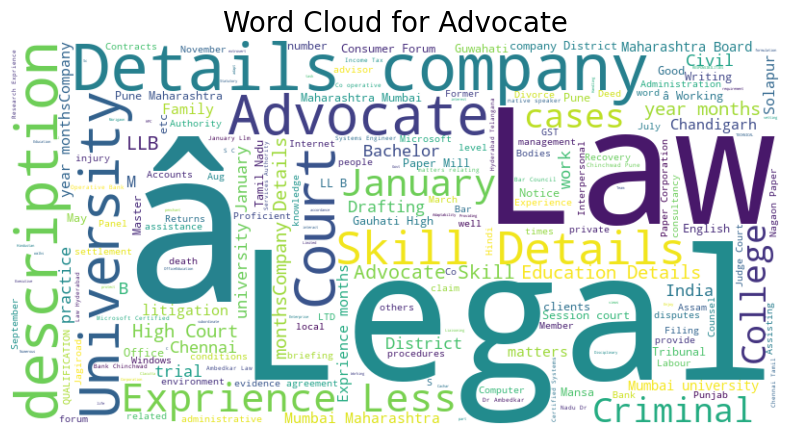

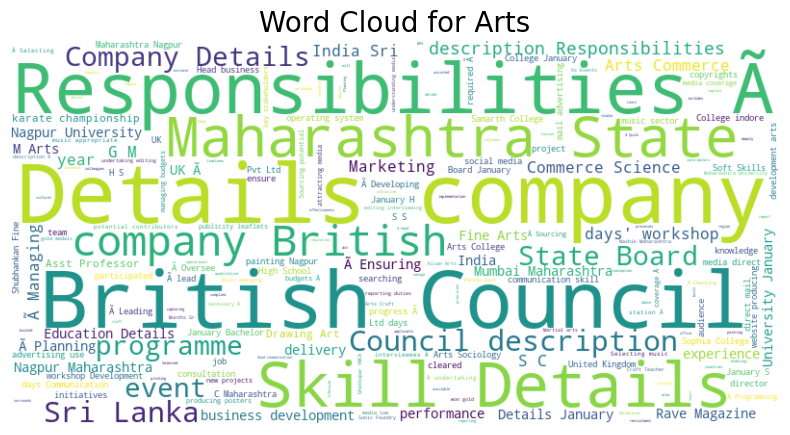

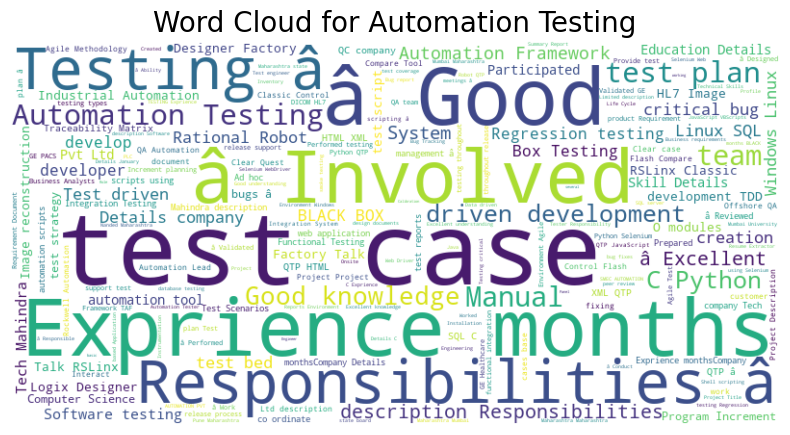

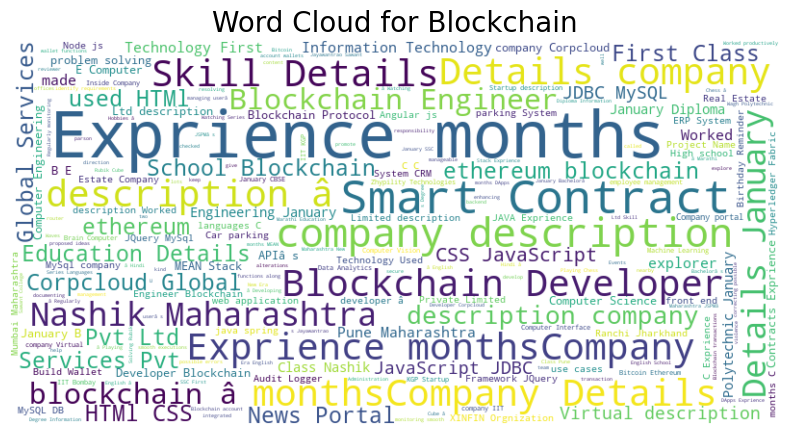

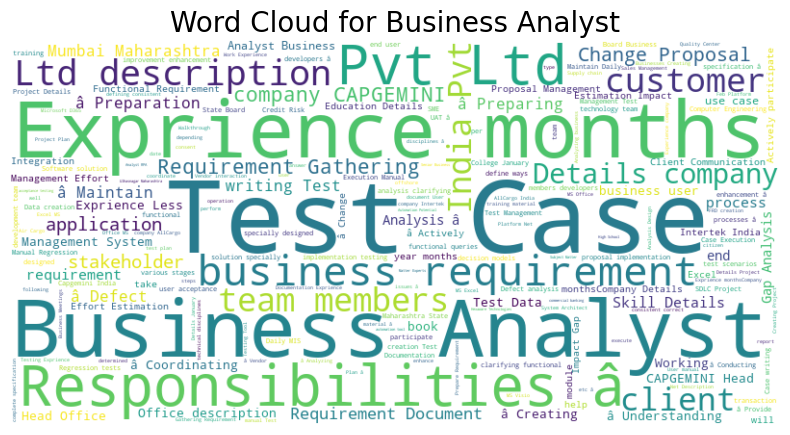

...

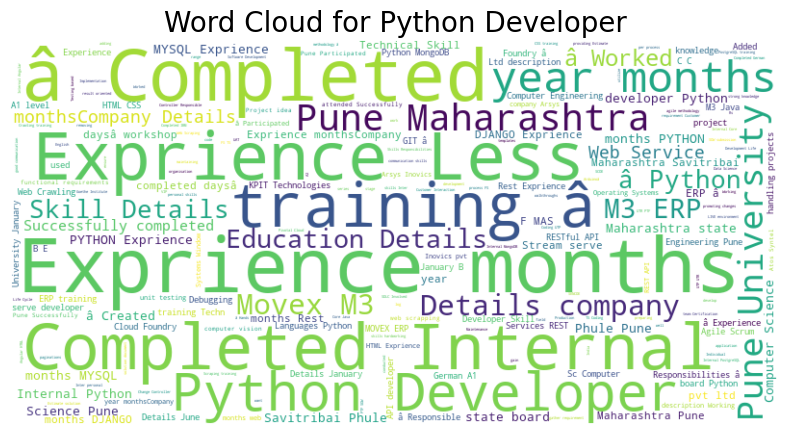

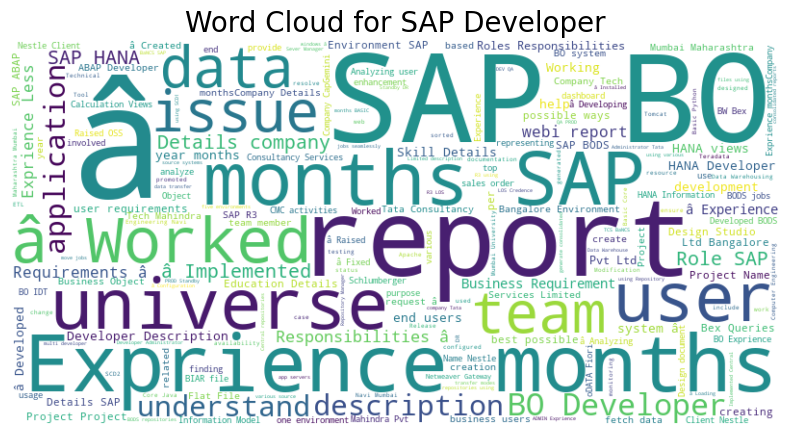

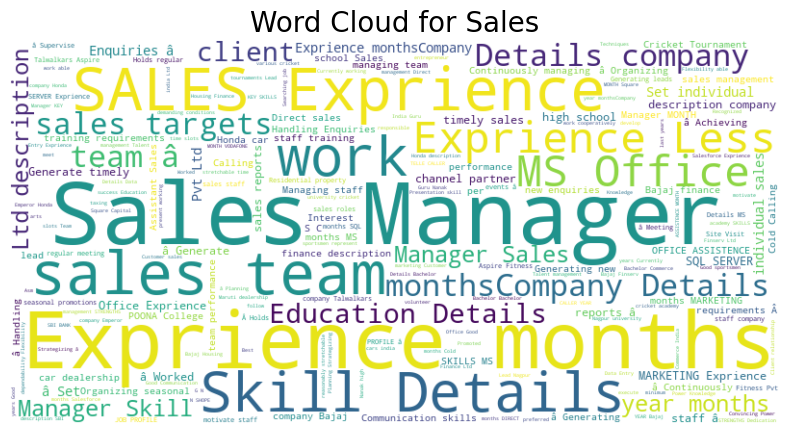

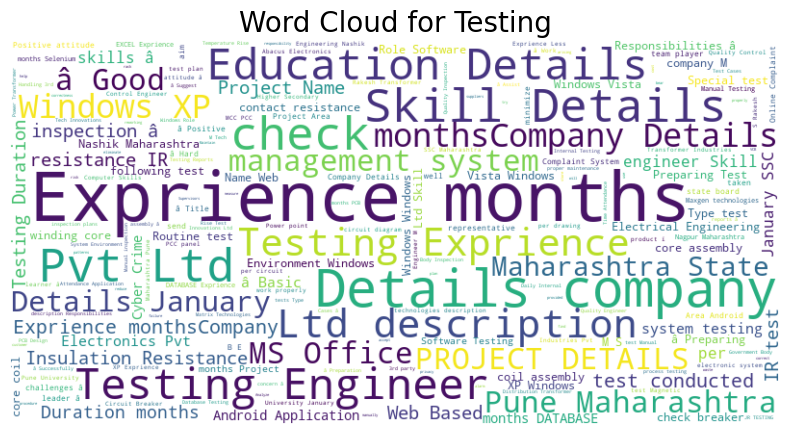

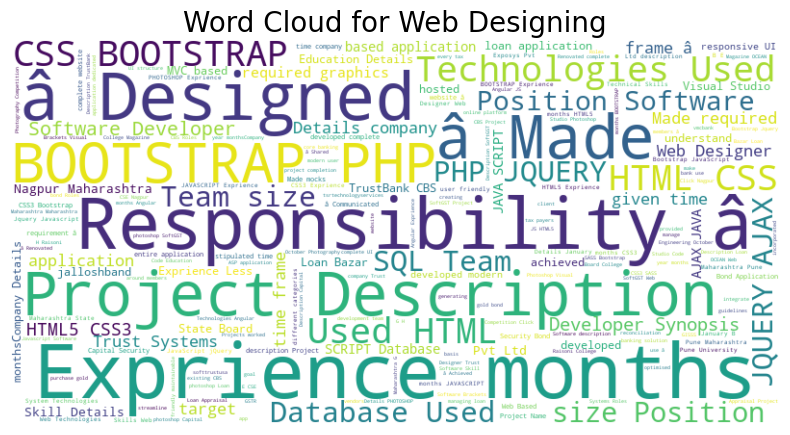

In [24]:


# Combine the relevant columns into one 
data['text'] = (data['Resume'].astype(str))

# Group the text by category
grouped_text = data.groupby('Category')['text'].apply(lambda x: ' '.join(x)).reset_index()

# Define a function to generate and display word cloud
def generate_word_cloud(text, Category):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {Category}', fontsize=20)
    plt.axis('off')
    plt.show()

# Generate word clouds for each category
for index, row in grouped_text.iterrows():
    generate_word_cloud(row['text'], row['Category'])

<p style="padding: 10px; background-color: #0f4c5c; margin: 0; color: white; 
font-family: 'New Times Roman', serif; font-size: 150%; text-align: center; 
font-weight: 500;">
Data Cleaning
</p>


- Data cleaning is a crucial step in the data analysis process, involving the correction or removal of incorrect, corrupted, duplicate, or incomplete data within a dataset.
- Through various techniques such as filling missing values, removing outliers, and standardizing data formats, 
- it ensures the accuracy and reliability of subsequent analyses and decision-making

In [25]:
# Check for missing values
print(data.isnull().sum())

Category    0
Resume      0
text        0
dtype: int64


In [26]:
#Get the list of English stop words
stopwords_list = stopwords.words('english')
print(stopwords_list)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [27]:
def remove_stopwords(text):
    """
    Remove stopwords from a given text.
    Parameters:
        text (str): The input text from which to remove stopwords.
        language (str): The language of the stopwords. Default is 'english'.
    Returns:
        filtered_text (str): Text without stopwords.
    """
    
    stop_words = set([
    "i", "me", "my", "myself", "we", "our", "ours", "ourselves", "you", "your", 
    "yours", "yourself", "yourselves", "he", "him", "his", "himself", "she", 
    "her", "hers", "herself", "it", "its", "itself", "they", "them", "their", 
    "theirs", "themselves", "what", "which", "who", "whom", "this", "that", 
    "these", "those", "am", "is", "are", "was", "were", "be", "been", "being", 
    "have", "has", "had", "having", "do", "does", "did", "doing", "a", "an", 
    "the", "and", "but", "if", "or", "because", "as", "until", "while", "of", 
    "at", "by", "for", "with", "about", "against", "between", "into", "through", 
    "during", "before", "after", "above", "below", "to", "from", "up", "down", 
    "in", "out", "on", "off", "over", "under", "again", "further", "then", 
    "once", "here", "there", "when", "where", "why", "how", "all", "any", 
    "both", "each", "few", "more", "most", "other", "some", "such", "no", 
    "nor", "not", "only", "own", "same", "so", "than", "too", "very", "s", 
    "t", "can", "will", "just", "don", "should", "now"
    ])
    words = text.split()  # Simple tokenization by spaces
    filtered_words = [word for word in words if word.lower() not in stop_words]
    filtered_text = ' '.join(filtered_words)
    return filtered_text

In [28]:
def cleanResume(txt):
    """
    Clean the text in the resume i.e. remove unwanted chars in the text. For e.g. 
    1 URLs,
    2 Hashtags,
    3 Mentions,
    4 Special Chars,
    5 Punctuations
    Parameters:
        resume_text (str): The input resume text to be cleaned.
    Returns:
        clean_text (str): Clean Resume.
    """
    cleanText = re.sub('http\S+\s', ' ', txt)
    cleanText = re.sub('RT|cc', ' ', cleanText)
    cleanText = re.sub('#\S+\s', ' ', cleanText)
    cleanText = re.sub('@\S+', '  ', cleanText)  
    cleanText = re.sub('[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', cleanText)
    cleanText = re.sub(r'[^\x00-\x7f]', ' ', cleanText) 
    cleanText = re.sub('\s+', ' ', cleanText)
    cleanText  = remove_stopwords(cleanText)
    return cleanText

In [29]:
cleanResume("my #### $ # the is #noorsaeed webiste like is this http://heloword and access it @gmain.com")

'webiste like ess'

In [30]:
data['Category'][15]

'Data Science'

In [31]:
data['Resume'][15]

"SKILLS C Basics, IOT, Python, MATLAB, Data Science, Machine Learning, HTML, Microsoft Word, Microsoft Excel, Microsoft Powerpoint. RECOGNITION Academic Secured First place in B.Tech.Education Details \r\nAugust 2014 to May 2018 B.Tech.  Ghatkesar, Andhra Pradesh Aurora's Scientific and Technological Institute\r\nJune 2012 to May 2014  Secondary Education Warangal, Telangana SR Junior College\r\nData Science \r\n\r\n\r\nSkill Details \r\nMS OFFICE- Exprience - Less than 1 year months\r\nC- Exprience - Less than 1 year months\r\nmachine learning- Exprience - Less than 1 year months\r\ndata science- Exprience - Less than 1 year months\r\nMatlab- Exprience - Less than 1 year monthsCompany Details \r\ncompany - \r\ndescription - "

In [32]:
le = LabelEncoder()

In [33]:
le.fit(data['Category'])
data['Category'] = le.transform(data['Category'])

In [34]:
data.Category.unique()

array([ 6, 12,  0,  1, 24, 16, 22, 14,  5, 15,  4, 21,  2, 11, 18, 20,  8,
       17, 19,  7, 13, 10,  9,  3, 23])

In [35]:
tfidf = TfidfVectorizer(stop_words='english')

tfidf.fit(data['Resume'])
resumeTextTFIDF  = tfidf.transform(data['Resume'])

In [36]:
resumeTextTFIDF

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 164274 stored elements and shape (962, 7384)>

In [37]:
X_train, X_test, y_train, y_test = train_test_split(resumeTextTFIDF, data['Category'], test_size=0.3, random_state=42)

<p style="padding: 10px; background-color: #0f4c5c; margin: 0; color: white; 
font-family: 'New Times Roman', serif; font-size: 150%; text-align: center; 
font-weight: 500;">
Modelling
</p>

In [38]:
#clf = OneVsRestClassifier(KNeighborsClassifier())
clf = KNeighborsClassifier()
clf.fit(X_train,y_train)
ypred = clf.predict(X_test)
print(accuracy_score(y_test,ypred))

0.986159169550173


In [39]:
pickle.dump(tfidf,open('tfidf.pkl','wb'))
pickle.dump(clf, open('clf.pkl', 'wb'))

<p style="padding: 10px; background-color: #0f4c5c; margin: 0; color: white; 
font-family: 'New Times Roman', serif; font-size: 150%; text-align: center; 
font-weight: 500;">
Predictions
</p>
 

In [40]:
myresume = """Full Stack Developer turned Data Science
Practitioner. Data-Driven, Passionate Data
Scientist and Machine Learning Enthusiast.
My passion for uncovering insights and
answering complex questions with the help
of data has led me to the field of Data
Science. Have previous experience of
handling and managing IT startup in the
service sector. Working experience of 8+
years.
Education
CFILT, IIT, BOMBAY 2016
Research Internship: NLP, ML, DL, IR
DCST, GOA UNIVERSITY 2014 - 16
Master of Technology: Computer Science
GOA UNIVERSITY 2010 - 13
Bachelor of Engineering: IT
BOARD OF TECHNICAL EDU. GOA 2007-10
Diploma in Electronics and Communication
WORK EXPERIENCE
DATA SCIENTIST
Technirmiti Softwares Pvt. Ltd.
June 2022 - Present
PYTHON ENGINEER
Technirmiti Softwares Pvt. Ltd.
May 2018 - Dec 2021
FULL STACK DEVELOPER
TechNirmiti Solutions
June 2016 - May 2018
SKILLS & ABILITIES
Data Science, Data Analytics, ML, Data
Collection, DL, NLP, Web Development, Python,
Django, MERN, VueJs, SQL, MongoDB
FRAMEWORKS & LIBRARIES
Scikit-Learn, TensorFlow, Keras, Pytorch,
NumPy, Pandas, SciPy Seaborn Matplotlib,
Streamlit, Gensim, NLTK, SpaCy, TextBlob, bs4,
OpenCV
projects
INFORMATION RETRIEVAL SYSTEM USING DEEP
LEARNING TECHNIQUES
TECHNOLOGIES: Python, Pandas, NumPy, MatplotliB,
Word2Vec, Doc2Vec
This was done as part of M.Tech. Final Year dissertation
where in i explored the usage of Deep Learning Techniques
like word and doc embeddings to retrieve the similar
information.
AUTOMATIC QUESTION GENERATION SYSTEM -
HINDI
TECHNOLOGIES: Python, Flask, PHP CodeIgnter, Bootstarp,
This was done as part of company Project in collaboration
CIFILT, IIT Bombay and MIT Boston. This was an Web
Application in EduTech to test the competency of the
student in the Indian Language. We use Hindi Shabdmitra
as a knowledge base for the application.
AUTOMATIC QUESTION GENERATION SYSTEM -
ENGLISH
TECHNOLOGIES: Python, Flask, PHP CodeIgnter, Bootstarp,
This was done as part of company Project in collaboration
MIT Boston. This was an Web Application in EduTech to
test the competency of the student in the English Language.
other postions
IT COMMITTEE MEMBERGoa Chamber of Commerce & Industry (GCCI) IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER IT COMMITTEE MEMBER TheKode.Biz | Mumbai Based AI, ITes CompanyLEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) LEAD DATA SCIENTIST (ADVISORY BOARD) Tripytoe | Goan Travel Tech StartupCHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER CHIEF TECHNOLOGY OFFICER Goan Narrative | Digital News PlatformCHIEF
"""

In [41]:
# Load the trained classifier
clf = pickle.load(open('/kaggle/working/clf.pkl', 'rb'))
tfidf = pickle.load(open('/kaggle/working/tfidf.pkl', 'rb'))

# Clean the input resume
cleaned_resume = cleanResume(myresume)

# Transform the cleaned resume using the trained TfidfVectorizer
input_features = tfidf.transform([cleaned_resume])

# Make the prediction using the loaded classifier
prediction_id = clf.predict(input_features)[0]


In [42]:
# Map category ID to category name
category_mapping = {
    15: "Java Developer",
    23: "Testing",
    8: "DevOps Engineer",
    20: "Python Developer",
    24: "Web Designing",
    12: "HR",
    13: "Hadoop",
    3: "Blockchain",
    10: "ETL Developer",
    18: "Operations Manager",
    6: "Data Science",
    22: "Sales",
    16: "Mechanical Engineer",
    1: "Arts",
    7: "Database",
    11: "Electrical Engineering",
    14: "Health and fitness",
    19: "PMO",
    4: "Business Analyst",
    9: "DotNet Developer",
    2: "Automation Testing",
    17: "Network Security Engineer",
    21: "SAP Developer",
    5: "Civil Engineer",
    0: "Advocate",
}

category_name = category_mapping.get(prediction_id, "Unknown")

print("Predicted Category:", category_name)
print(prediction_id)

Predicted Category: Data Science
6


# <p style="padding:10px;background-color:#0f4c5c;margin:0;color:white;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Conclusion</p>



# <p style="padding:10px;background-color:#0f4c5c;margin:0;color:white;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Recommendations</p>

